<a href="https://colab.research.google.com/github/dilliraj1987/Ex10_NLP_Sentiment_Analysis/blob/main/NLP_Sentiment_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import re
import nltk
from textblob import TextBlob
from wordcloud import WordCloud
from nltk.corpus import stopwords
from sklearn.feature_extraction.text import CountVectorizer

pd.set_option('max_colwidth', None)

In [ ]:
df = pd.read_csv('/content/hashtag_donaldtrump.csv', lineterminator='\n', usecols = ['tweet'])
df.head(10)

,tweet
0,#Elecciones2020 | En #Florida: #JoeBiden dice que #DonaldTrump solo se preocupa por él mismo. El demócrata fue anfitrión de encuentros de electores en #PembrokePines y #Miramar. Clic AQUÍ ⬇️⬇️⬇️\n⠀\n🌐https://t.co/qhIWpIUXsT\n_\n#ElSolLatino #yobrilloconelsol https://t.co/6FlCBWf1Mi
1,"Usa 2020, Trump contro Facebook e Twitter: coprono Biden #donaldtrump https://t.co/6ceURhe1VP https://t.co/94jidLjoON"
2,"#Trump: As a student I used to hear for years, for ten years, I heard China! In 2019! And we have 1.5 and they don't know how many we have and I asked them how many do we have and they said 'sir we don't know.' But we have millions. Like 300 million.\n\nUm. What?"
3,2 hours since last tweet from #Trump! Maybe he is VERY busy. Tremendously busy.
4,You get a tie! And you get a tie! #Trump ‘s rally #Iowa https://t.co/jJalUUmh5D
5,@CLady62 Her 15 minutes were over long time ago. Omarosa never represented the black community! #TheReidOut \n\nShe cried to #Trump begging for a job!
6,@richardmarx Glad u got out of the house! DICK!!#trump 2020💪🏽🇺🇸🇺🇸
7,@DeeviousDenise @realDonaldTrump @nypost There won’t be many of them. Unless you all have been voting more than once again. But God prevails. BO was the most corrupt President ever. Dark to light. Your lies are all coming through. They wouldn’t last forever. #Trump
8,One of the single most effective remedies to eradicate another round of #Trump Plague in our #WhiteHouse. https://t.co/QGB9ODIVS8
9,#Election2020 #Trump \n#FreedomOfSpeech https://t.co/9slOZFZNHJ


In [ ]:
df.shape

(229015, 1)

In [ ]:
df = df[0:100000]
df.shape

(100000, 1)

In [ ]:
df.isnull().sum()

tweet    0
dtype: int64

In [ ]:
contractions = { 
"ain't": "am not / are not / is not / has not / have not",
"aren't": "are not / am not",
"can't": "cannot",
"can't've": "cannot have",
"'cause": "because",
"could've": "could have",
"couldn't": "could not",
"couldn't've": "could not have",
"didn't": "did not",
"doesn't": "does not",
"don't": "do not",
"hadn't": "had not",
"hadn't've": "had not have",
"hasn't": "has not",
"haven't": "have not",
"he'd": "he had / he would",
"he'd've": "he would have",
"he'll": "he shall / he will",
"he'll've": "he shall have / he will have",
"he's": "he has / he is",
"how'd": "how did",
"how'd'y": "how do you",
"how'll": "how will",
"how's": "how has / how is / how does",
"I'd": "I had / I would",
"I'd've": "I would have",
"I'll": "I shall / I will",
"I'll've": "I shall have / I will have",
"I'm": "I am",
"I've": "I have",
"isn't": "is not",
"it'd": "it had / it would",
"it'd've": "it would have",
"it'll": "it shall / it will",
"it'll've": "it shall have / it will have",
"it's": "it has / it is",
"let's": "let us",
"ma'am": "madam",
"mayn't": "may not",
"might've": "might have",
"mightn't": "might not",
"mightn't've": "might not have",
"must've": "must have",
"mustn't": "must not",
"mustn't've": "must not have",
"needn't": "need not",
"needn't've": "need not have",
"o'clock": "of the clock",
"oughtn't": "ought not",
"oughtn't've": "ought not have",
"shan't": "shall not",
"sha'n't": "shall not",
"shan't've": "shall not have",
"she'd": "she had / she would",
"she'd've": "she would have",
"she'll": "she shall / she will",
"she'll've": "she shall have / she will have",
"she's": "she has / she is",
"should've": "should have",
"shouldn't": "should not",
"shouldn't've": "should not have",
"so've": "so have",
"so's": "so as / so is",
"that'd": "that would / that had",
"that'd've": "that would have",
"that's": "that has / that is",
"there'd": "there had / there would",
"there'd've": "there would have",
"there's": "there has / there is",
"they'd": "they had / they would",
"they'd've": "they would have",
"they'll": "they shall / they will",
"they'll've": "they shall have / they will have",
"they're": "they are",
"they've": "they have",
"to've": "to have",
"wasn't": "was not",
"we'd": "we had / we would",
"we'd've": "we would have",
"we'll": "we will",
"we'll've": "we will have",
"we're": "we are",
"we've": "we have",
"weren't": "were not",
"what'll": "what shall / what will",
"what'll've": "what shall have / what will have",
"what're": "what are",
"what's": "what has / what is",
"what've": "what have",
"when's": "when has / when is",
"when've": "when have",
"where'd": "where did",
"where's": "where has / where is",
"where've": "where have",
"who'll": "who shall / who will",
"who'll've": "who shall have / who will have",
"who's": "who has / who is",
"who've": "who have",
"why's": "why has / why is",
"why've": "why have",
"will've": "will have",
"won't": "will not",
"won't've": "will not have",
"would've": "would have",
"wouldn't": "would not",
"wouldn't've": "would not have",
"y'all": "you all",
"y'all'd": "you all would",
"y'all'd've": "you all would have",
"y'all're": "you all are",
"y'all've": "you all have",
"you'd": "you had / you would",
"you'd've": "you would have",
"you'll": "you shall / you will",
"you'll've": "you shall have / you will have",
"you're": "you are",
"you've": "you have"
}

In [ ]:
def cont_to_exp(x):
     if type(x) is str:
        x = x.replace('\\', '')
        for key in contractions:
            value = contractions[key]
            x = x.replace(key, value)
        return x
     else:
        return x

In [ ]:
cont_to_exp("i don't have any money\.")

'i do not have any money.'

In [ ]:
df['tweet'] = df['tweet'].apply(lambda x: cont_to_exp(x))
df.head()

,tweet
0,#Elecciones2020 | En #Florida: #JoeBiden dice que #DonaldTrump solo se preocupa por él mismo. El demócrata fue anfitrión de encuentros de electores en #PembrokePines y #Miramar. Clic AQUÍ ⬇️⬇️⬇️\n⠀\n🌐https://t.co/qhIWpIUXsT\n_\n#ElSolLatino #yobrilloconelsol https://t.co/6FlCBWf1Mi
1,"Usa 2020, Trump contro Facebook e Twitter: coprono Biden #donaldtrump https://t.co/6ceURhe1VP https://t.co/94jidLjoON"
2,"#Trump: As a student I used to hear for years, for ten years, I heard China! In 2019! And we have 1.5 and they do not know how many we have and I asked them how many do we have and they said 'sir we do not know.' But we have millions. Like 300 million.\n\nUm. What?"
3,2 hours since last tweet from #Trump! Maybe he is VERY busy. Tremendously busy.
4,You get a tie! And you get a tie! #Trump ‘s rally #Iowa https://t.co/jJalUUmh5D


In [ ]:
def clean_tweets(text):
    text = re.sub(r'\brt\b', "", text) # remove retweets RT
    text = re.sub(r'[^\w ]+', "", text) # remove mentions4
    text = re.sub(r'([a-z0-9+._-]+@[a-z0-9+._-]+\.[a-z0-9+_-])',"", text) # remove emails
    text = re.sub(r'([http|https|ftp|ssh])://([\w_-]+(?:(?:\.[\w_-]+)+))([\w.,@?^=%/~+#-]*[\w@?^=%&/~+#-])?',"", text) # remove Urls
    text = re.sub(r'\n', "", text)
    return text

In [ ]:
df['tweet'] = df['tweet'].apply(lambda x: clean_tweets(x))

In [ ]:
df.head(10)

,tweet
0,Elecciones2020 En Florida JoeBiden dice que DonaldTrump solo se preocupa por él mismo El demócrata fue anfitrión de encuentros de electores en PembrokePines y Miramar Clic AQUÍ httpstcoqhIWpIUXsT_ElSolLatino yobrilloconelsol httpstco6FlCBWf1Mi
1,Usa 2020 Trump contro Facebook e Twitter coprono Biden donaldtrump httpstco6ceURhe1VP httpstco94jidLjoON
2,Trump As a student I used to hear for years for ten years I heard China In 2019 And we have 15 and they do not know how many we have and I asked them how many do we have and they said sir we do not know But we have millions Like 300 millionUm What
3,2 hours since last tweet from Trump Maybe he is VERY busy Tremendously busy
4,You get a tie And you get a tie Trump s rally Iowa httpstcojJalUUmh5D
5,CLady62 Her 15 minutes were over long time ago Omarosa never represented the black community TheReidOut She cried to Trump begging for a job
6,richardmarx Glad u got out of the house DICKtrump 2020
7,DeeviousDenise realDonaldTrump nypost There wont be many of them Unless you all have been voting more than once again But God prevails BO was the most corrupt President ever Dark to light Your lies are all coming through They wouldnt last forever Trump
8,One of the single most effective remedies to eradicate another round of Trump Plague in our WhiteHouse httpstcoQGB9ODIVS8
9,Election2020 Trump FreedomOfSpeech httpstco9slOZFZNHJ


In [ ]:
' '.join(df['tweet'].tolist()[:10])

'Elecciones2020  En Florida JoeBiden dice que DonaldTrump solo se preocupa por él mismo El demócrata fue anfitrión de encuentros de electores en PembrokePines y Miramar Clic AQUÍ httpstcoqhIWpIUXsT_ElSolLatino yobrilloconelsol httpstco6FlCBWf1Mi Usa 2020 Trump contro Facebook e Twitter coprono Biden  donaldtrump httpstco6ceURhe1VP httpstco94jidLjoON Trump As a student I used to hear for years for ten years I heard China In 2019 And we have 15 and they do not know how many we have and I asked them how many do we have and they said sir we do not know But we have millions Like 300 millionUm What 2 hours since last tweet from Trump Maybe he is VERY busy Tremendously busy You get a tie And you get a tie Trump s rally Iowa httpstcojJalUUmh5D CLady62 Her 15 minutes were over long time ago Omarosa never represented the black community TheReidOut She cried to Trump begging for a job richardmarx Glad u got out of the house DICKtrump 2020 DeeviousDenise realDonaldTrump nypost There wont be many o

In [ ]:
df['polarity'] = df['tweet'].apply(lambda x: TextBlob(x).sentiment.polarity)
df['tweet_len'] = df['tweet'].apply(lambda x: len(x))
df['word_count'] = df['tweet'].apply(lambda x: len(x.split()))

In [ ]:
def avg_word_len(x):
    words = x.split()
    word_len = 0
    for word in words:
        word_len += len(word)
        
    return word_len / len(words)

In [ ]:
df['avg_word_len'] = df['tweet'].apply(lambda x: avg_word_len(x))

In [ ]:
df.head()

,tweet,polarity,tweet_len,word_count,avg_word_len
0,Elecciones2020 En Florida JoeBiden dice que DonaldTrump solo se preocupa por él mismo El demócrata fue anfitrión de encuentros de electores en PembrokePines y Miramar Clic AQUÍ httpstcoqhIWpIUXsT_ElSolLatino yobrilloconelsol httpstco6FlCBWf1Mi,0.000000,244,30,7.133333
1,Usa 2020 Trump contro Facebook e Twitter coprono Biden donaldtrump httpstco6ceURhe1VP httpstco94jidLjoON,0.000000,105,12,7.750000
2,Trump As a student I used to hear for years for ten years I heard China In 2019 And we have 15 and they do not know how many we have and I asked them how many do we have and they said sir we do not know But we have millions Like 300 millionUm What,0.333333,247,56,3.428571
3,2 hours since last tweet from Trump Maybe he is VERY busy Tremendously busy,0.076667,75,14,4.428571
4,You get a tie And you get a tie Trump s rally Iowa httpstcojJalUUmh5D,0.000000,69,14,4.000000


In [ ]:
from plotly.offline import iplot
import cufflinks as cf
cf.go_offline()
cf.set_config_file(offline=False)

In [ ]:
df['polarity'].iplot(kind='hist', color = 'red', bins = 20)

In [ ]:
df['word_count'].iplot(kind = 'hist', xTitle = 'words', yTitle = 'Count', title = 'Sentiment Polarity Distribution')

In [ ]:
df['avg_word_len'].iplot(kind='hist', bins = 50, xTitle = 'Avg_word_len', yTitle = 'count', title = 'Avg_Word_len Distribution')

In [ ]:
df['tweet_len'].iplot(kind='hist', bins= 100, color = 'orange', linecolor='gray', xTitle='Tweet Length', yTitle='Count', title = 'Tweet Length Distribution')

In [ ]:
allwords = ' '.join([twt for twt in df['tweet']])
wordcloud = WordCloud(width = 1600, height=800, random_state=42, background_color = 'white', stopwords = stopwords.words('english'), min_font_size = 10).generate(allwords)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

LookupError: ignored

In [ ]:
def polarity_to_sentiment(x):
#     if type(x) is float:
#         for i in range(0, len(x)):
    if x > 0:
        return 1 # 1 = Positive
    if x < 0:
        return 0 # 0 = negative
    else:
        return 2 # 2 = Neutral

In [ ]:
df['sentiments'] = df['polarity'].apply(lambda x: polarity_to_sentiment(x))

In [ ]:
df.head()

,tweet,polarity,tweet_len,word_count,avg_word_len,sentiments
0,Elecciones2020 En Florida JoeBiden dice que DonaldTrump solo se preocupa por él mismo El demócrata fue anfitrión de encuentros de electores en PembrokePines y Miramar Clic AQUÍ httpstcoqhIWpIUXsT_ElSolLatino yobrilloconelsol httpstco6FlCBWf1Mi,0.000000,244,30,7.133333,2
1,Usa 2020 Trump contro Facebook e Twitter coprono Biden donaldtrump httpstco6ceURhe1VP httpstco94jidLjoON,0.000000,105,12,7.750000,2
2,Trump As a student I used to hear for years for ten years I heard China In 2019 And we have 15 and they do not know how many we have and I asked them how many do we have and they said sir we do not know But we have millions Like 300 millionUm What,0.333333,247,56,3.428571,1
3,2 hours since last tweet from Trump Maybe he is VERY busy Tremendously busy,0.076667,75,14,4.428571,1
4,You get a tie And you get a tie Trump s rally Iowa httpstcojJalUUmh5D,0.000000,69,14,4.000000,2


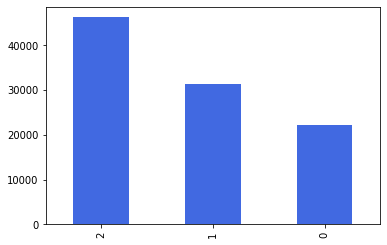

In [ ]:
df['sentiments'].value_counts().plot.bar(color='royalblue')

In [ ]:
# dependent Features
y = df['sentiments']

# Independent Features
X = df.drop('sentiments', axis=1)

In [ ]:
messages = X.copy()

In [ ]:
from nltk import PorterStemmer
nltk.download('stopwords')
nltk.download('words')
words = set(nltk.corpus.words.words())
stopwords = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Unzipping corpora/words.zip.


In [ ]:
ps = PorterStemmer()
corpus = []
for i in range(0, len(messages)):
    review = re.sub('[^a-zA-Z]', ' ', messages['tweet'][i])
    review = review.lower()
    review = review.split()
    review = [w for w in nltk.wordpunct_tokenize(str(review)) if w.lower() in words or not w.isalpha()]
    
    review = [ps.stem(word) for word in review if not word in stopwords]
    review = ' '.join(review)
    corpus.append(review)

In [ ]:
corpus[0]

"[' ', ' en ', ' ', ' ', ' dice ', ' ', ' ', ' solo ', ' se ', ' ', ' ', ' l ', ' ', ' el ', ' ', ' ', ' ', ' ', ' n ', ' de ', ' ', ' de ', ' ', ' en ', ' ', ' ', ' ', ' ', ' ', ' ', ' ', ' ', ' ', ' ', ' mi ']"

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer

In [ ]:
voc_size = 50000
max_len = 120
embedding_features = 32

In [ ]:
tokenizer = Tokenizer(num_words=voc_size, oov_token = '<OOV>')
tokenizer.fit_on_texts(corpus)

In [ ]:
sequences = tokenizer.texts_to_sequences(corpus)

In [ ]:
from tensorflow.keras.preprocessing.sequence import pad_sequences
embedded_doc = pad_sequences(sequences, maxlen=max_len, padding= 'post', truncating = 'post')
embedded_doc[0]

array([  2,   2,   2,  21,   2,   2,   2,   2,   2,   2, 972,   2,   2,
         2,   2,   2,   2, 877,   2,   2,  97,   2,   2,   2,   2,   2,
         2,  73,   2,   2,   2,   2,  52,   2,   2,   2,   2,   2,   2,
         2,   2,   2,   2,  20,   2,   2,   7,   2,   2,   2,   2,   7,
         2,   2,   2,   2,  21,   2,   2,   2,   2,   2,   2,   2,   2,
         2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,   2,
         2, 644,   2,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
         0,   0,   0], dtype=int32)

In [ ]:
X_final = np.array(embedded_doc)
y_final = np.array(y)

In [ ]:
X_final.shape, y_final.shape

((100000, 120), (100000,))

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, LSTM, Dense, Dropout, GRU

In [ ]:
model = Sequential()
model.add(Embedding(voc_size, embedding_features, input_length = max_len))
# model.add(Dropout(0.3))
model.add(GRU(100))
model.add(Dense(62, activation = 'relu'))
# model.add(Dropout(0.3))
model.add(Dense(32, activation = 'relu'))
# model.add(Dropout(0.3))
model.add(Dense(3, activation = 'softmax'))
model.compile(loss = 'sparse_categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 120, 32)           1600000   
                                                                 
 gru (GRU)                   (None, 100)               40200     
                                                                 
 dense (Dense)               (None, 62)                6262      
                                                                 
 dense_1 (Dense)             (None, 32)                2016      
                                                                 
 dense_2 (Dense)             (None, 3)                 99        
                                                                 
Total params: 1,648,577
Trainable params: 1,648,577
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_final, y_final, test_size = 0.25, stratify = y, random_state=42)

In [ ]:
model.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 5, batch_size=32)

Epoch 1/5
2344/2344 [==============================] - 256s 108ms/step - loss: 0.6675 - accuracy: 0.7210 - val_loss: 0.4881 - val_accuracy: 0.8296
Epoch 2/5
2344/2344 [==============================] - 252s 108ms/step - loss: 0.4523 - accuracy: 0.8437 - val_loss: 0.4463 - val_accuracy: 0.8491
Epoch 3/5
2344/2344 [==============================] - 253s 108ms/step - loss: 0.4093 - accuracy: 0.8593 - val_loss: 0.4686 - val_accuracy: 0.8327
Epoch 4/5
2344/2344 [==============================] - 252s 107ms/step - loss: 0.3840 - accuracy: 0.8679 - val_loss: 0.4408 - val_accuracy: 0.8474
Epoch 5/5
2344/2344 [==============================] - 251s 107ms/step - loss: 0.3517 - accuracy: 0.8779 - val_loss: 0.4177 - val_accuracy: 0.8579


In [ ]:
y_pred = ((model.predict(X_test)>0.5).astype('int32'))

782/782 [==============================] - 20s 24ms/step


In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, np.argmax(y_pred, axis = 1))

array([[ 4448,   650,   475],
       [  949,  6220,   695],
       [  730,   260, 10573]])

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, np.argmax(y_pred, axis=1))

0.84964

In [ ]:
model = Sequential()
model.add(Embedding(voc_size, embedding_features, input_length = max_len))
# model.add(Dropout(0.3))
model.add(LSTM(100))
model.add(Dense(62, activation = 'relu'))
# model.add(Dropout(0.3))
model.add(Dense(32, activation = 'relu'))
# model.add(Dropout(0.3))
model.add(Dense(3, activation = 'softmax'))
model.compile(loss = 'sparse_categorical_crossentropy', optimizer = 'adam', metrics = ['accuracy'])
print(model.summary())

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_1 (Embedding)     (None, 120, 32)           1600000   
                                                                 
 lstm (LSTM)                 (None, 100)               53200     
                                                                 
 dense_3 (Dense)             (None, 62)                6262      
                                                                 
 dense_4 (Dense)             (None, 32)                2016      
                                                                 
 dense_5 (Dense)             (None, 3)                 99        
                                                                 
Total params: 1,661,577
Trainable params: 1,661,577
Non-trainable params: 0
_________________________________________________________________
None


In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_final, y_final, test_size = 0.25, stratify = y, random_state=42)

In [ ]:
model.fit(X_train, y_train, validation_data = (X_test, y_test), epochs = 5, batch_size=32)

Epoch 1/5
2344/2344 [==============================] - 294s 124ms/step - loss: 0.9911 - accuracy: 0.4815 - val_loss: 1.0074 - val_accuracy: 0.4625
Epoch 2/5
2344/2344 [==============================] - 287s 123ms/step - loss: 0.9140 - accuracy: 0.5422 - val_loss: 0.6258 - val_accuracy: 0.7090
Epoch 3/5
2344/2344 [==============================] - 291s 124ms/step - loss: 0.5595 - accuracy: 0.7771 - val_loss: 0.5118 - val_accuracy: 0.8218
Epoch 4/5
2344/2344 [==============================] - 288s 123ms/step - loss: 0.4614 - accuracy: 0.8376 - val_loss: 0.4511 - val_accuracy: 0.8477
Epoch 5/5
2344/2344 [==============================] - 290s 124ms/step - loss: 0.4136 - accuracy: 0.8556 - val_loss: 0.4415 - val_accuracy: 0.8529


In [ ]:
y_pred = ((model.predict(X_test)>0.5).astype('int32'))

782/782 [==============================] - 30s 37ms/step


In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test, np.argmax(y_pred, axis = 1))

array([[ 4224,   852,   497],
       [  850,  6160,   854],
       [  579,   190, 10794]])

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test, np.argmax(y_pred, axis=1))

0.84712